# Reduction

In this notebook, you will learn how to “prepare” a science frame in order to perform scientific measurement on it.

Requisites:
* a working Python 3.x environment, with **Astropy** (4.0), **Matplotlib** (3.1), and **NumPy** (1.18) installed;
* a ```utils.py``` file with useful functions;
* a science frame (e.g. ```sci_2015/Autosave Image -001.fit```);
* a set of bias frames (i.e. ```bias_3x3/CCD Image NN.fit```);
* a set of flat frames (i.e. ```flat_3x3/CCD Image NN.fit```);

## A quick look to the data

Let's load the science frame and the set of bias/flat frames: 

In [1]:
from astropy.io import fits
from utils import plot_img
import matplotlib.pyplot as plt

sci = fits.open('sci_2015/Autosave Image -001.fit')[0]
bias_arr = [fits.open('bias_3x3/CCD Image %i.fit' % i)[0] for i in range(9,17)]
flat_arr = [fits.open('flat_3x3/CCD Image %i.fit' % i)[0] for i in range(9,17)]

plot_img(sci.data)
plot_img(bias_arr[0].data)
plot_img(flat_arr[0].data)
plt.show()

<Figure size 2000x1200 with 2 Axes>

<Figure size 2000x1200 with 2 Axes>

<Figure size 2000x1200 with 2 Axes>

The plots need some rescaling to be readable. You can define a range of ADUs centered on the median value of the frame: 

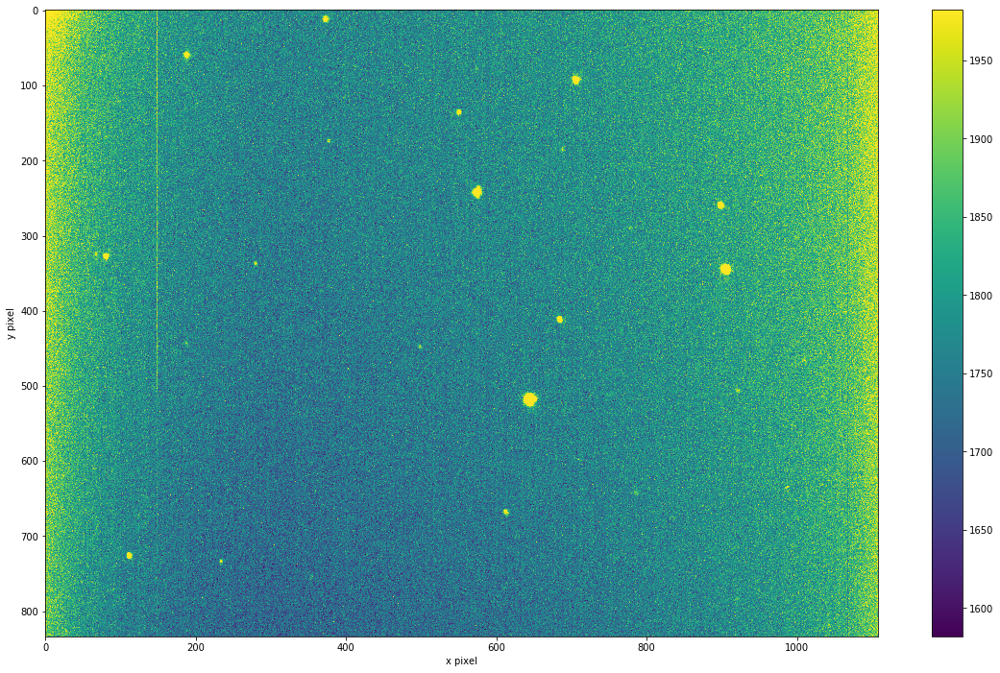

In [2]:
import numpy as np

sci_med = np.median(sci.data)
sci_vmin, sci_vmax = sci_med-200, sci_med+200

plot_img(sci.data, vmin=sci_vmin, vmax=sci_vmax)

Of course there's a function for that in ```utils.py```:

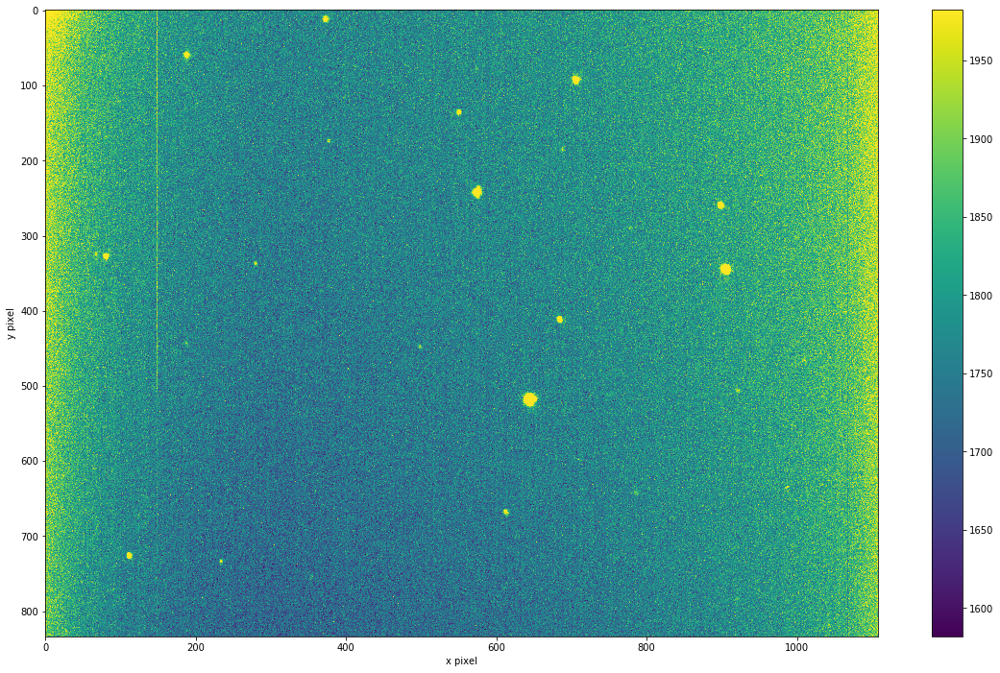

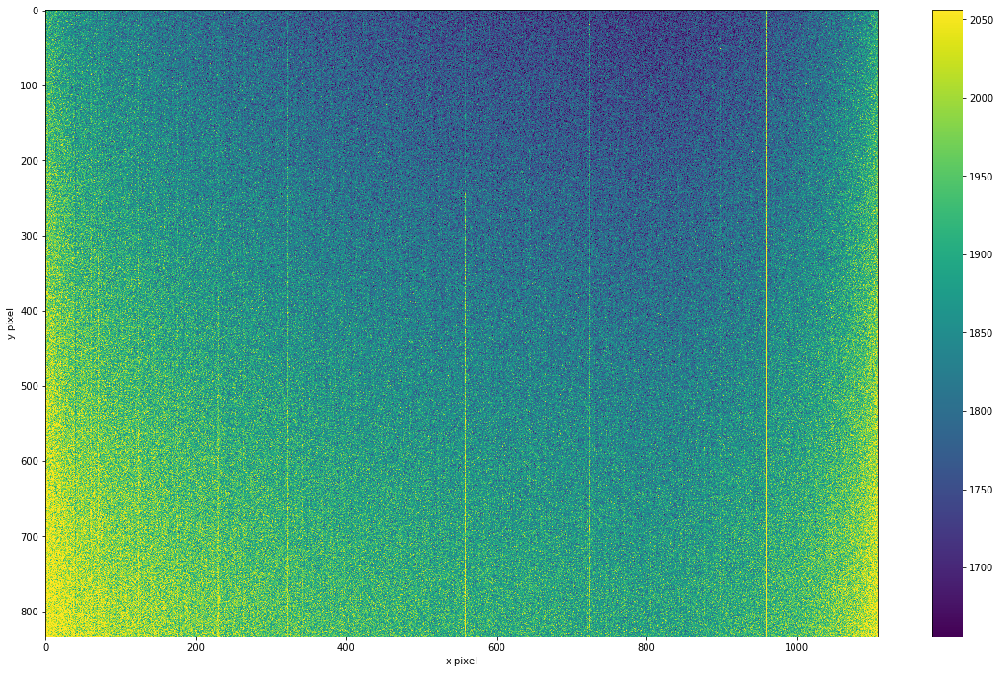

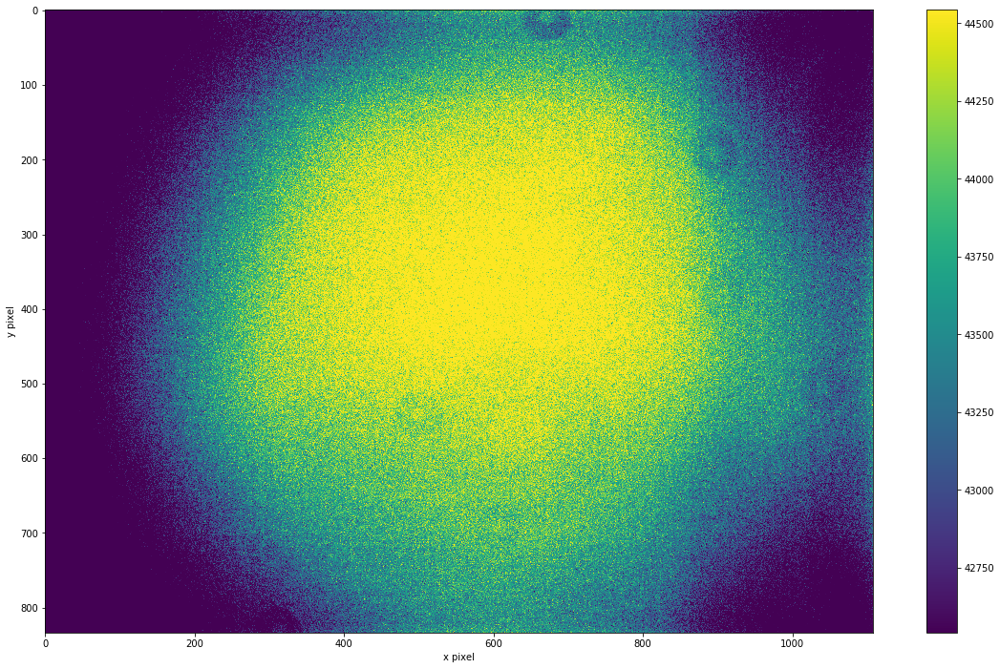

In [3]:
from utils import plot_img_medrange

plot_img_medrange(sci.data)
plot_img_medrange(bias_arr[0].data)
plot_img_medrange(flat_arr[0].data, hrange=1000)
plt.show()

You can notice from a column of bad pixels that the science frame is rotated by 180 degrees. Let's use ```flip``` to make it compatible with the calibrations:

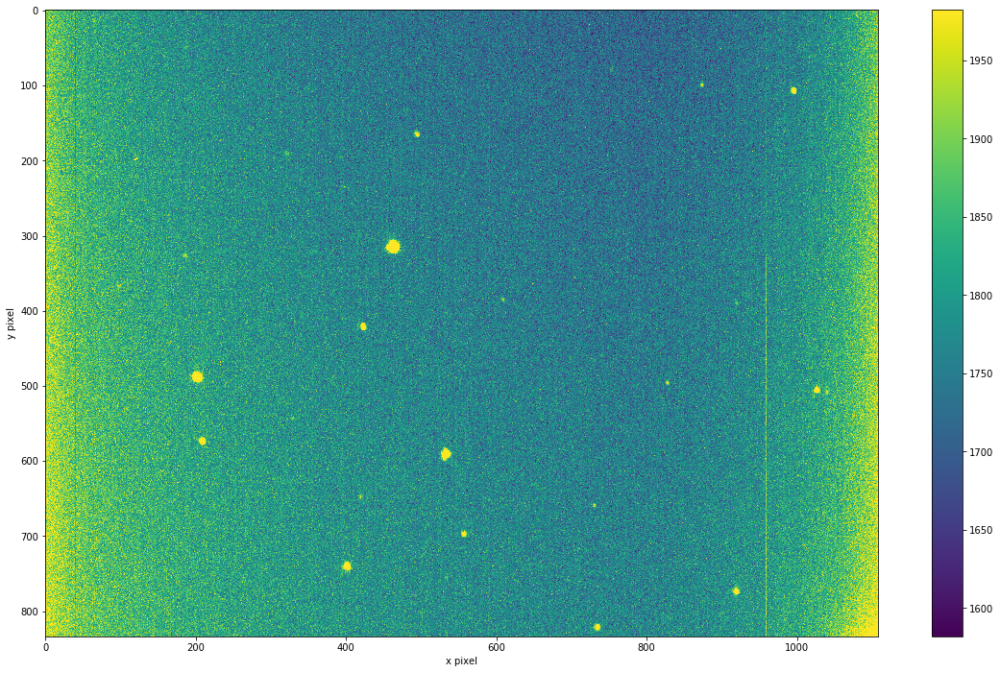

In [4]:
sci.data_right = np.flip(sci.data)
plot_img_medrange(sci.data_right)
plt.show()

## The master of all biases

A **master bias** is obtained by averaging several bias frames:

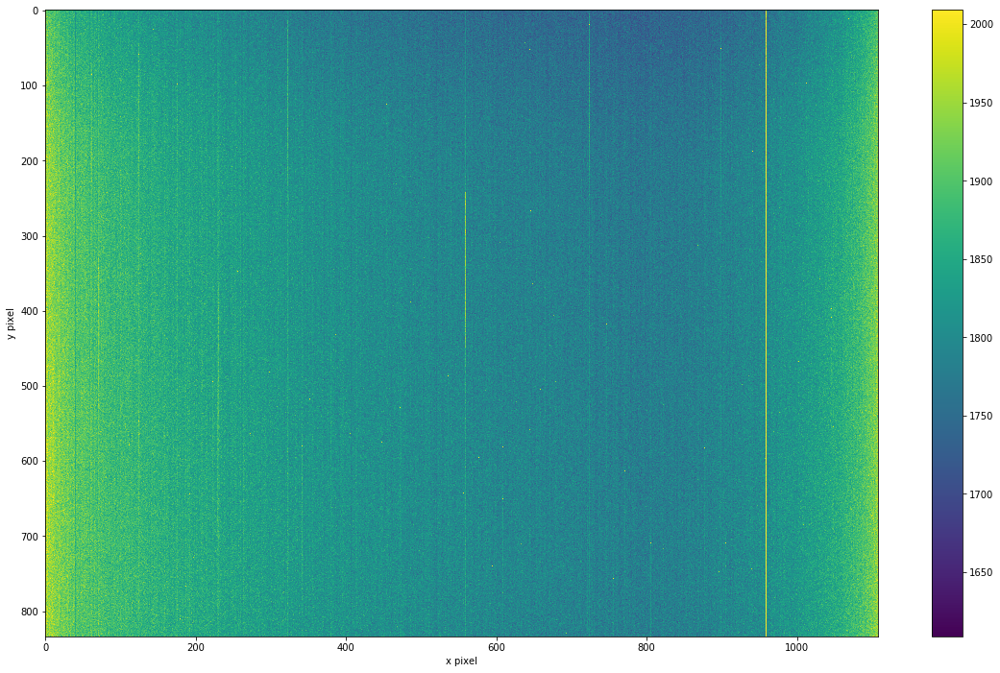

In [5]:
mbias = np.median([b.data for b in bias_arr], axis=0)
plot_img_medrange(mbias)

In this case, the median is not a good master bias because the individual bias frames are not so similar to each other; let's compare the median along the rows with those of the master bias and of the science frame:

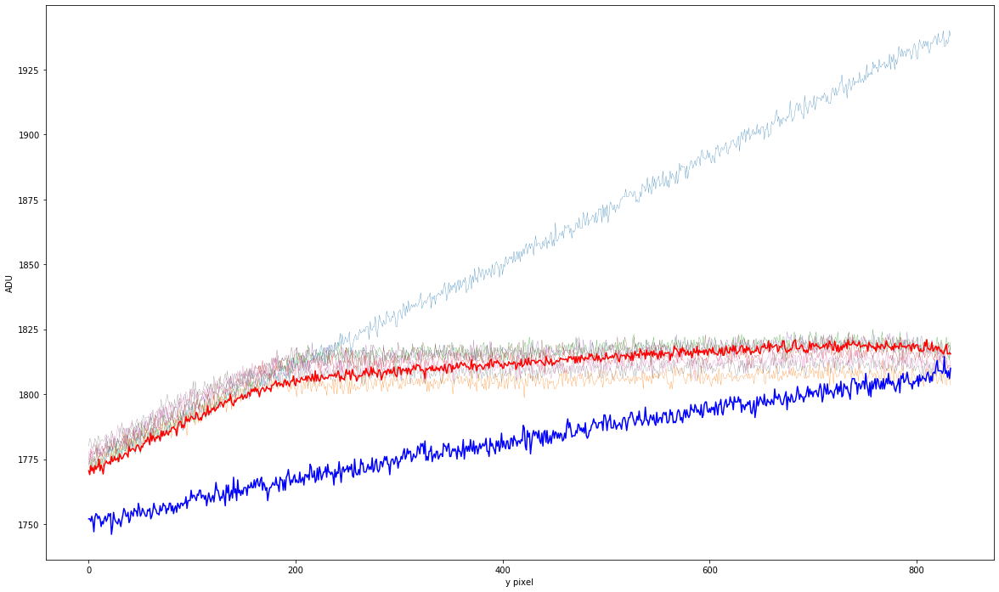

In [6]:
from utils import plot_graph

for i, b in enumerate(bias_arr):
    bias_row_med = np.median(b.data, axis=1)
    plot_graph(bias_row_med, new=i==0, xlabel='y pixel', ylabel='ADU', linewidth=0.3)

mbias_row_med = np.median(mbias, axis=1)
plot_graph(mbias_row_med, new=False, color='r')
sci_row_med = np.median(sci.data_right, axis=1)
plot_graph(sci_row_med, new=False, color='b')
plt.show()

This happens when the detector is not high-quality. If we subtract the master bias from the science frame, we are left with a noticeable residual: 

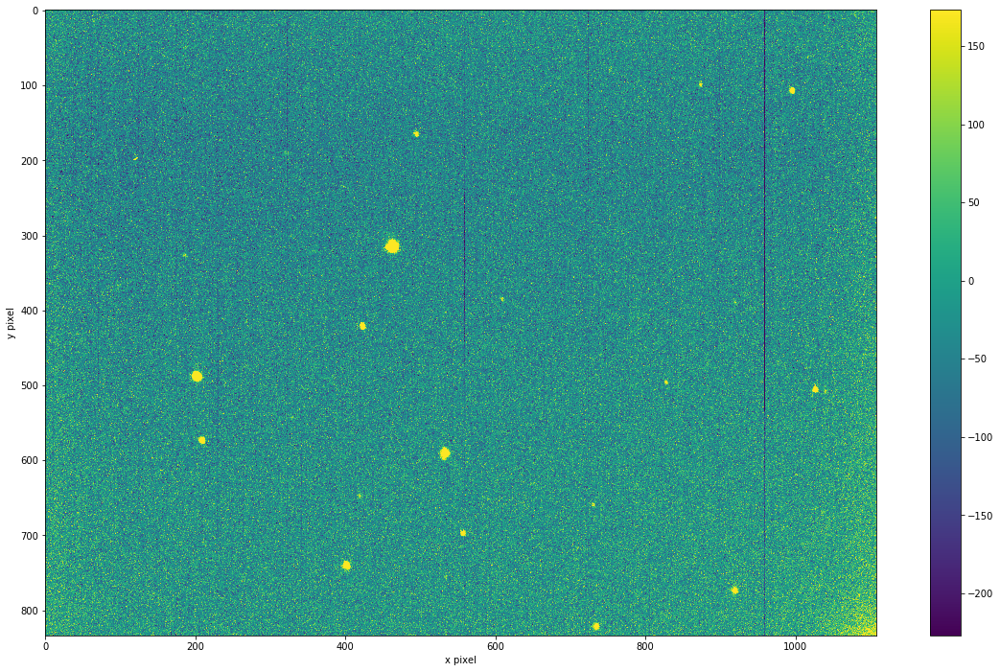

In [7]:
mbias = np.median([b.data for b in bias_arr[1:]], axis=0)
sci.debiased = sci.data_right-mbias
plot_img_medrange(sci.debiased)

This residual will be removed later, as a part of the background.

## Reading out the noise

Bias frames are not useless as they can help us estimate the **read-out noise** (RON) of the detector. We can choose a region where the bias is flat, and compute the standard deviation of bias values in that region (we omit the first bias frame, the outlier in the plot of ```bias_row_med``` above):

In [8]:
slice = np.s_[250:300, 250:300]

bias_std = np.mean([np.std(b.data[slice]) for b in bias_arr[1:]])

gain = 0.6  # ph/ADU
ron = bias_std*gain
print("%2.3f ph" % ron)

28.816 ph


We can check that the bias values are gaussianly distributed in the region, and the standard deviation is thus a good estimator of the RON:

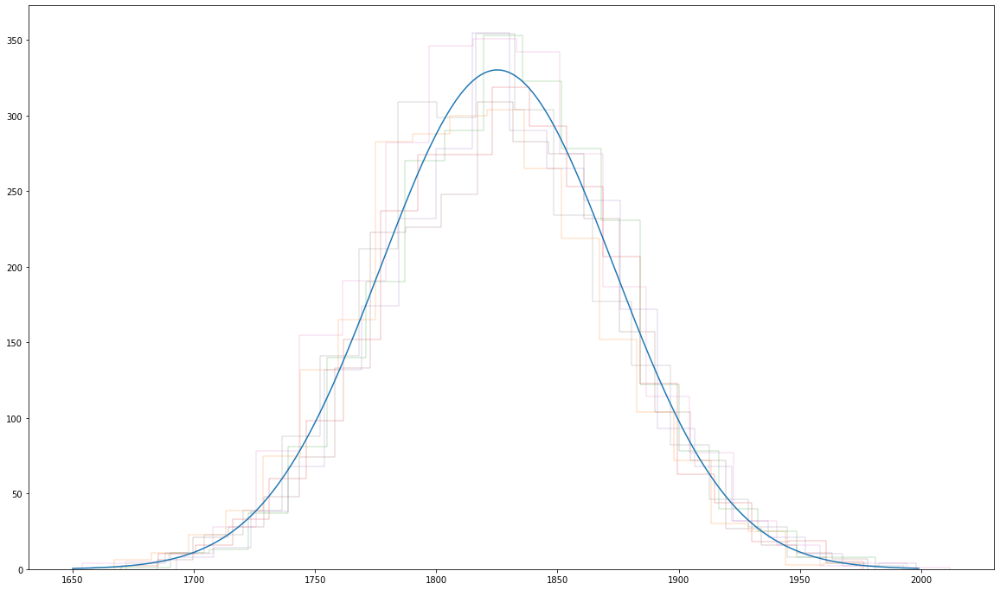

In [9]:
bias_mean = np.mean([np.mean(b.data[slice]) for b in bias_arr[1:]])
bias_max = np.mean([np.max(b.data[slice]) for b in bias_arr[1:]])
bins = 20

x = np.arange(1650,2000)
bias_gauss = 1./(np.sqrt(2.*np.pi)*bias_std) * np.exp(-np.power((x-bias_mean)/bias_std, 2.)/2)
bias_gauss_norm = bias_gauss * bias_max * bins

plot_graph(x, bias_gauss_norm)
[plt.hist(b.data[slice].ravel(), bins=bins, histtype='step', linewidth=0.3) for b in bias_arr[1:]]

plt.show()

### Make my field flat

Again, we collect and average a set of flat frames to create a **master flat**. The master bias is subtracted to the individual flat frames prior to averaging. The master flat is then normalized:

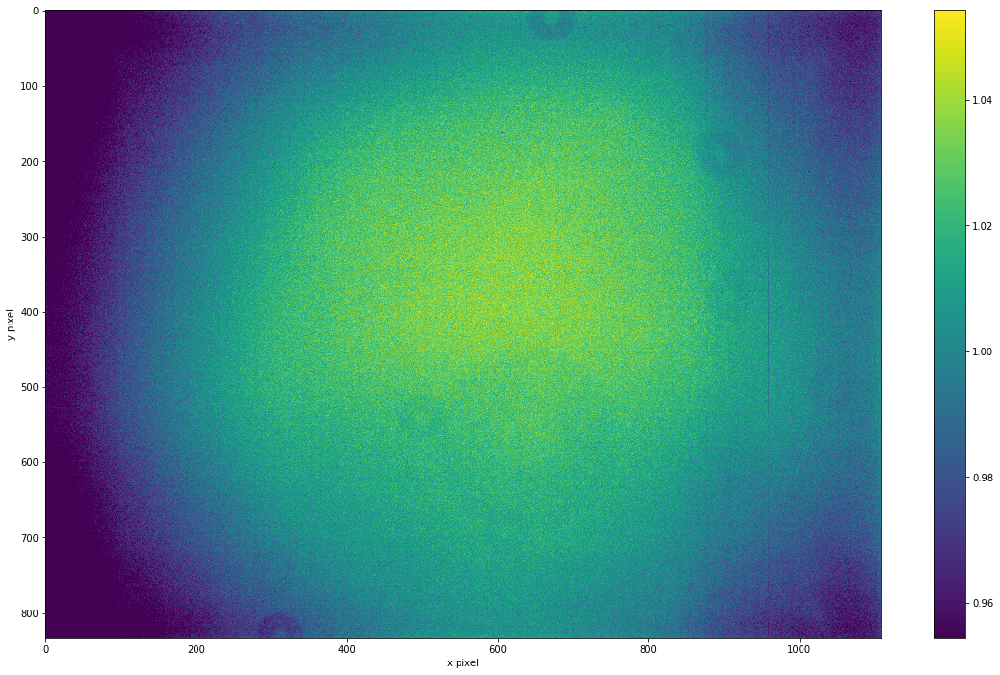

In [10]:
mflat = np.median([f.data-mbias for f in flat_arr], axis=0)
mflat = mflat/np.mean(mflat)
plot_img_medrange(mflat, hrange=0.05)

Flat-fielding is performed by dividing the debiased science frames by the master flat:

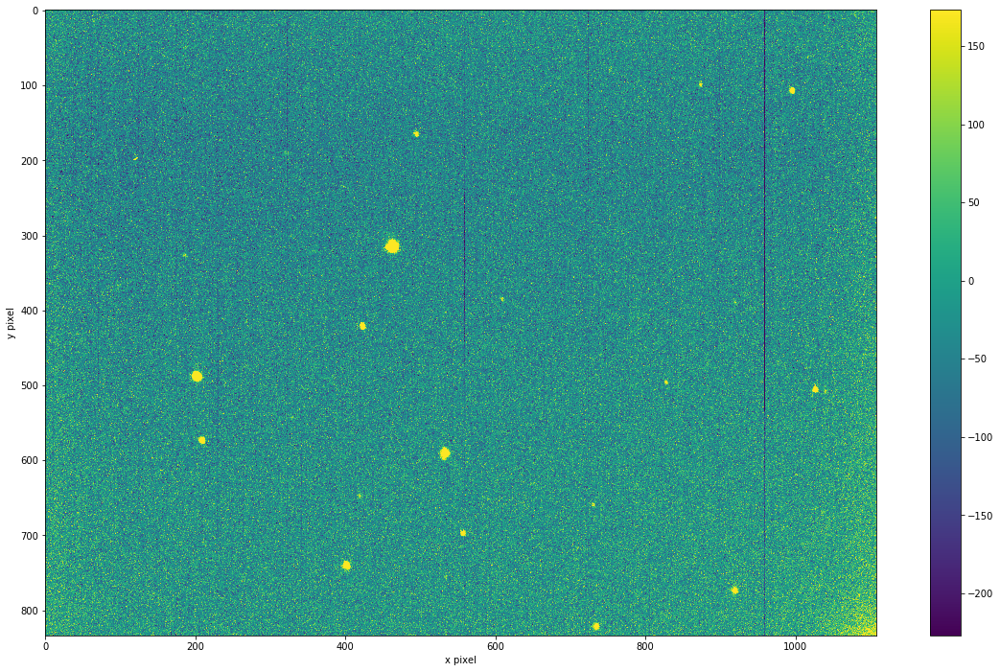

In [11]:
sci.ff = sci.debiased/mflat
plot_img_medrange(sci.debiased)

## Wrap-up

```utils.py``` includes a function to perform the whole reduction in one go. This is particularly convenient when you want to apply the procedures to all science frames in ```sci_2015/```:

In [12]:
from utils import reduce

for i in range(1,211):
    sci = fits.open('sci_2015/Autosave Image -%03i.fit' % i)[0]
    sci.data_right = np.flip(sci.data)
    sci.debiased, sci.ff = reduce(sci.data_right, mbias, mflat)
    sci.data = sci.ff
    sci.writeto('sci_2015/Reduced-%03i.fits' % i, overwrite=True)